<a href="https://colab.research.google.com/github/vasanthsai26/stanford_cars_image_classification/blob/main/Stanford_cars_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# StanFord Cars Image Classification

## Problem Statement

<p>The aim of this project is to develop an image classification system that can accurately classify vehicle image into one of the 196 classes of cars. The classification system will be built using PyTorch and will utilize a deep learning approach to recognize and classify different vehicles.</p>

<p> we will consider a combination of accuracy, precision, recall, and F1-score which could provide better evaluation of the image classification system</p>

## Dataset



> The StanFord Cars dataset contains 16,185 images of 196 classes of cars. The data is split into 8,144 training images and 8,041 testing images, where each class has been split roughly in a 50-50 split. Classes are typically at the level of Make, Model, Year, ex. 2012 Tesla Model S or 2012 BMW M3 coupe.


> Each class has around 35 images.







# Installing and Importing the required packages

In [ ]:
!pip install torchinfo opendatasets wandb munch --upgrade --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 50.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 20.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.4/209.4 kB 22.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.7 MB/s eta 0:00:00


In [ ]:
## General Imports
import os
import cv2
import time
import copy
import math
import wandb
import random
import pickle
import zipfile
import opendatasets as od


from PIL import Image
from munch import Munch
from pathlib import Path
from scipy.io import loadmat
from datetime import datetime
from tqdm.notebook import tqdm
from collections import OrderedDict
from typing import Dict, List, Tuple,Optional

## Data Analysis packages
import numpy as np
import pandas as pd

## Data Visualization packages
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from matplotlib.patches import Rectangle

## for ignoring warnings
import warnings
warnings.filterwarnings('ignore')

## torch and transformers imports
import torch
import torch.nn as nn
import torchvision

from torch import optim
from torchinfo import summary
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter

# from transformers import ViTModel, ViTConfig


## sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score,precision_score,recall_score

In [ ]:
print(f"Torch Version : {torch.__version__}")
print(f"TorchVision Version : {torchvision.__version__}")

Torch Version : 2.0.1+cu118
TorchVision Version : 0.15.2+cu118


In [ ]:
# wandb.login()

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# Read and Analyse the Data

In [ ]:
kaggle_url = "https://www.kaggle.com/datasets/eduardo4jesus/stanford-cars-dataset"
od.download(kaggle_url)

100%|██████████| 1.82G/1.82G [01:29<00:00, 21.8MB/s]


In [ ]:
#DIR configs
DATA_PATH = Path('/content/stanford-cars-dataset')
META_PATH = Path(os.path.join(DATA_PATH,"car_devkit","devkit"))
CARS_TRAIN_PATH = Path(os.path.join(DATA_PATH,"cars_train","cars_train"))
CARS_TEST_PATH = Path(os.path.join(DATA_PATH,"cars_test","cars_test"))

In [ ]:
os.listdir(META_PATH)

['README.txt',
 'eval_train.m',
 'cars_train_annos.mat',
 'cars_meta.mat',
 'cars_test_annos.mat',
 'train_perfect_preds.txt']

In [ ]:
with open(META_PATH/"README.txt","r") as readme:
    txt_file = readme.readlines()
for line in txt_file:
    if not line.isspace():
        print(line.strip())

This file gives documentation for the cars 196 dataset.
(http://ai.stanford.edu/~jkrause/cars/car_dataset.html)
----------------------------------------
Metadata/Annotations
----------------------------------------
Descriptions of the files are as follows:
-cars_meta.mat:
Contains a cell array of class names, one for each class.
-cars_train_annos.mat:
Contains the variable 'annotations', which is a struct array of length
num_images and where each element has the fields:
bbox_x1: Min x-value of the bounding box, in pixels
bbox_x2: Max x-value of the bounding box, in pixels
bbox_y1: Min y-value of the bounding box, in pixels
bbox_y2: Max y-value of the bounding box, in pixels
class: Integral id of the class the image belongs to.
fname: Filename of the image within the folder of images.
-cars_test_annos.mat:
Same format as 'cars_train_annos.mat', except the class is not provided.
----------------------------------------
Submission file format
----------------------------------------
Files

### Cars Classes Meta Info


In [ ]:
cars_meta = loadmat(META_PATH/'cars_meta.mat')

In [ ]:
labels = [car for car in cars_meta["class_names"][0]]
labels = pd.DataFrame(labels,columns=["class_labels"])

In [ ]:
labels.head()

,class_labels
0,AM General Hummer SUV 2000
1,Acura RL Sedan 2012
2,Acura TL Sedan 2012
3,Acura TL Type-S 2008
4,Acura TSX Sedan 2012


- The labels are made up of Make, Model,Type, Year. we will replace the spaces with underscore



In [ ]:
labels['class_labels'] = labels['class_labels'].str.replace(' ', '_')

## Training Data : cars_train_annos.mat file

In [ ]:
#read the .mat file
cars_train_annos = loadmat(META_PATH/'cars_train_annos.mat')

In [ ]:
#parse the train annotations mat file
train_data = [[val.flat[0] for val in line] for line in cars_train_annos["annotations"][0]]
train_data[:5]

[[39, 116, 569, 375, 14, '00001.jpg'],
 [36, 116, 868, 587, 3, '00002.jpg'],
 [85, 109, 601, 381, 91, '00003.jpg'],
 [621, 393, 1484, 1096, 134, '00004.jpg'],
 [14, 36, 133, 99, 106, '00005.jpg']]

- We will create a DataFrame train_df with file path and class name


In [ ]:
columns = ["bbox_x1","bbox_y1","bbox_x2","bbox_y2","class_idx","fname"]
train_df = pd.DataFrame(train_data,columns=columns)
train_df.head()

,bbox_x1,bbox_y1,bbox_x2,bbox_y2,class_idx,fname
0,39,116,569,375,14,00001.jpg
1,36,116,868,587,3,00002.jpg
2,85,109,601,381,91,00003.jpg
3,621,393,1484,1096,134,00004.jpg
4,14,36,133,99,106,00005.jpg


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8144 entries, 0 to 8143
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   bbox_x1    8144 non-null   uint16
 1   bbox_y1    8144 non-null   uint16
 2   bbox_x2    8144 non-null   uint16
 3   bbox_y2    8144 non-null   uint16
 4   class_idx  8144 non-null   uint8 
 5   fname      8144 non-null   object
dtypes: object(1), uint16(4), uint8(1)
memory usage: 135.3+ KB


In [ ]:
train_df.describe()

,bbox_x1,bbox_y1,bbox_x2,bbox_y2,class_idx
count,8144.000000,8144.000000,8144.000000,8144.000000,8144.000000
mean,64.906803,108.661223,638.208620,416.431606,98.979371
std,82.198684,104.551635,410.776734,273.786000,56.503148
min,1.000000,1.000000,76.000000,47.000000,1.000000
25%,19.000000,42.000000,392.000000,248.000000,50.000000
50%,39.000000,80.000000,569.000000,360.000000,99.000000
75%,79.000000,138.250000,746.250000,477.000000,148.000000
max,1648.000000,1508.000000,5205.000000,3389.000000,196.000000


- The minimum and maximum value of clasess are 1 and 196, we will modify this to 0 to 195

In [ ]:
train_df["class_idx"] = train_df["class_idx"] - 1

- We will merge the label names and image file path to this df

In [ ]:
train_df = train_df.merge(labels,left_on='class_idx', right_index=True)
train_df["file_path"] = train_df["fname"].apply(lambda x: os.path.join(CARS_TRAIN_PATH,x))
train_df.head(2)

,bbox_x1,bbox_y1,bbox_x2,bbox_y2,class_idx,fname,class_labels,file_path
0,39,116,569,375,13,00001.jpg,Audi_TTS_Coupe_2012,/content/stanford-cars-dataset/cars_train/cars...
16,39,52,233,150,13,00017.jpg,Audi_TTS_Coupe_2012,/content/stanford-cars-dataset/cars_train/cars...


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8144 entries, 0 to 8139
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   bbox_x1       8144 non-null   uint16
 1   bbox_y1       8144 non-null   uint16
 2   bbox_x2       8144 non-null   uint16
 3   bbox_y2       8144 non-null   uint16
 4   class_idx     8144 non-null   uint8 
 5   fname         8144 non-null   object
 6   class_labels  8144 non-null   object
 7   file_path     8144 non-null   object
dtypes: object(3), uint16(4), uint8(1)
memory usage: 326.1+ KB


- Frequency distribution

In [ ]:
class_counts = train_df['class_labels'].value_counts().to_frame().reset_index().rename(columns={"class_labels":"count","index":"class_labels"})
class_counts.head()

,class_labels,count
0,GMC_Savana_Van_2012,68
1,Chrysler_300_SRT-8_2010,49
2,Mercedes-Benz_300-Class_Convertible_1993,48
3,Mitsubishi_Lancer_Sedan_2012,48
4,Jaguar_XK_XKR_2012,47


In [ ]:
print(f'The Average number of Training Images per class is {class_counts["count"].mean()}')

The Average number of Training Images per class is 41.55102040816327


In [ ]:
class_counts.tail()

,class_labels,count
191,Rolls-Royce_Phantom_Drophead_Coupe_Convertible...,31
192,Chevrolet_Express_Cargo_Van_2007,30
193,Maybach_Landaulet_Convertible_2012,29
194,FIAT_500_Abarth_2012,28
195,Hyundai_Accent_Sedan_2012,24


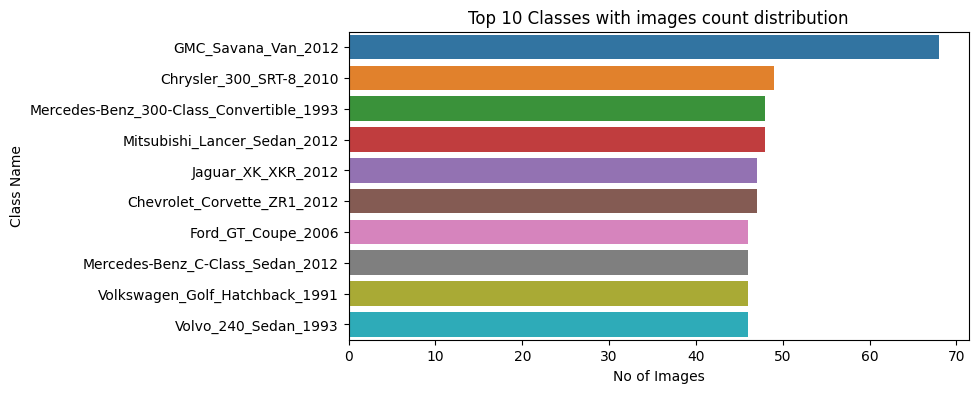

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(8,4))
sns.barplot(x="count",y="class_labels",data=class_counts.iloc[:10,:],ax=axes)
axes.set_ylabel("Class Name")
axes.set_xlabel("No of Images")
axes.set_title("Top 10 Classes with images count distribution")
fig.show();

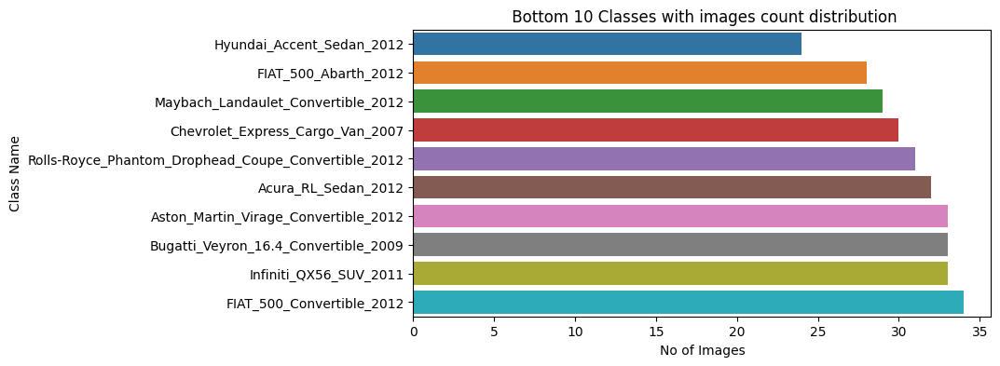

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(8,4))
sns.barplot(x="count",y="class_labels",data=class_counts.iloc[-10:,:].sort_values(by='count'),ax=axes)
axes.set_ylabel("Class Name")
axes.set_xlabel("No of Images")
axes.set_title(" Bottom 10 Classes with images count distribution" )
fig.show();

- Sample Training Images

In [ ]:
def get_image_details(df, idx):
    image_details = df.iloc[idx, :]
    img_path = Path(image_details["file_path"])

    if img_path.is_file():
        img = Image.open(img_path)

    xy = image_details["bbox_x1"], image_details["bbox_y1"]
    width = image_details["bbox_x2"] - image_details["bbox_x1"]
    height = image_details["bbox_y2"] - image_details["bbox_y1"]

    bbox_patch = Rectangle(xy, width, height, fill=False, color='r', linewidth=2)
    title = image_details["class_labels"] if "class_labels" in df.columns else "Test Image"

    return img, bbox_patch, title

def show_samples(df):
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))
    axes = [ax for sub_ax in axes for ax in sub_ax]

    for ax in axes:
        random_image_idx = random.choice(range(0, len(df)))
        img, bbox_patch, title = get_image_details(df, random_image_idx)
        ax.imshow(img)
        ax.add_patch(bbox_patch)
        ax.set_title(f"""
        Image class: {title}
        Image shape: {np.asarray(img).shape}""")
        ax.set_axis_off()

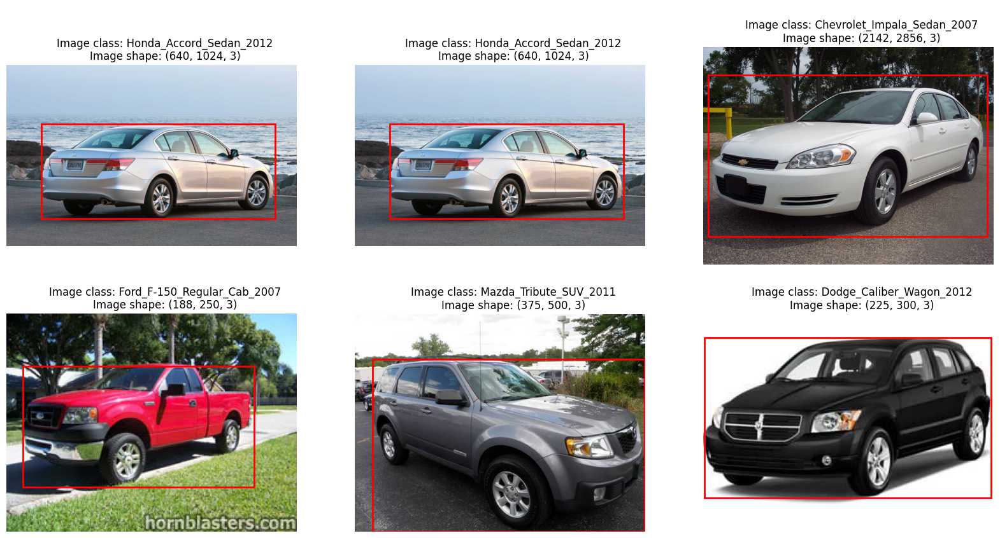

In [ ]:
show_samples(train_df)

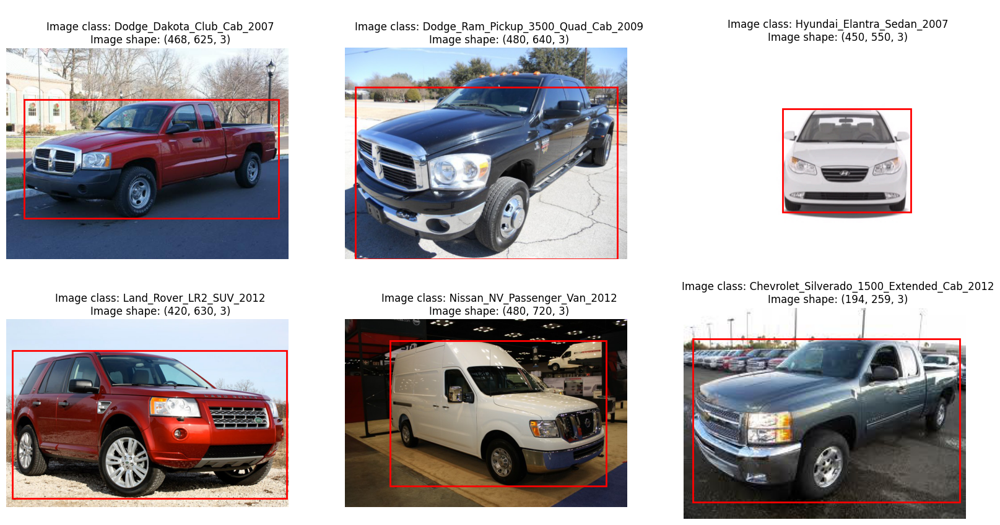

In [ ]:
show_samples(train_df)

## Test Data : cars_test_annos.mat file

In [ ]:
cars_test_annos = loadmat(META_PATH/'cars_test_annos.mat')

In [ ]:
test_data = [[val.flat[0] for val in line] for line in cars_test_annos["annotations"][0]]
test_data[:5]

[[30, 52, 246, 147, '00001.jpg'],
 [100, 19, 576, 203, '00002.jpg'],
 [51, 105, 968, 659, '00003.jpg'],
 [67, 84, 581, 407, '00004.jpg'],
 [140, 151, 593, 339, '00005.jpg']]

In [ ]:
columns = ["bbox_x1","bbox_y1","bbox_x2","bbox_y2","fname"]
test_df = pd.DataFrame(test_data,columns=columns)
test_df["file_path"] = test_df["fname"].apply(lambda x: os.path.join(CARS_TEST_PATH,x))
test_df.head(5)

,bbox_x1,bbox_y1,bbox_x2,bbox_y2,fname,file_path
0,30,52,246,147,00001.jpg,/content/stanford-cars-dataset/cars_test/cars_...
1,100,19,576,203,00002.jpg,/content/stanford-cars-dataset/cars_test/cars_...
2,51,105,968,659,00003.jpg,/content/stanford-cars-dataset/cars_test/cars_...
3,67,84,581,407,00004.jpg,/content/stanford-cars-dataset/cars_test/cars_...
4,140,151,593,339,00005.jpg,/content/stanford-cars-dataset/cars_test/cars_...


In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8041 entries, 0 to 8040
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   bbox_x1    8041 non-null   uint16
 1   bbox_y1    8041 non-null   uint16
 2   bbox_x2    8041 non-null   uint16
 3   bbox_y2    8041 non-null   uint16
 4   fname      8041 non-null   object
 5   file_path  8041 non-null   object
dtypes: object(2), uint16(4)
memory usage: 188.6+ KB


- Test samples

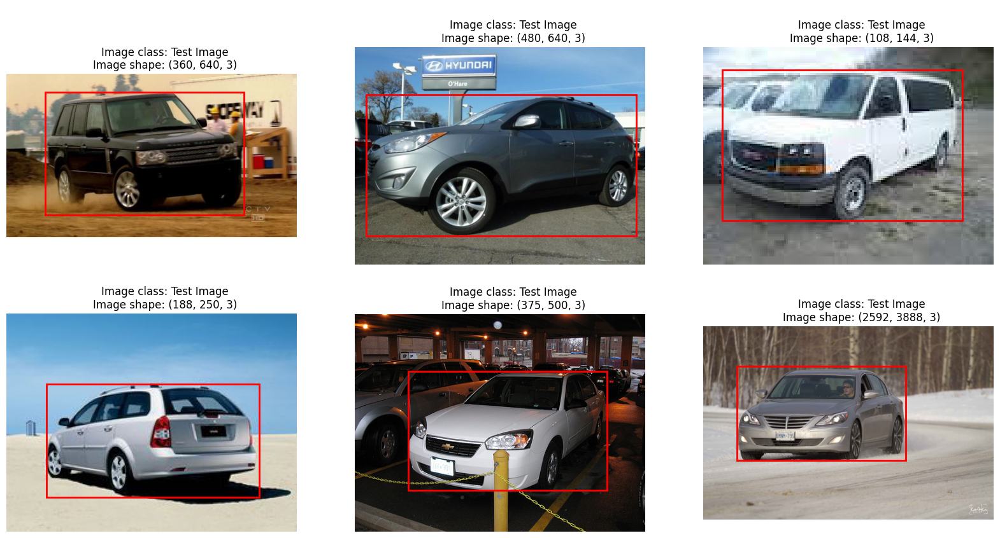

In [ ]:
show_samples(test_df)

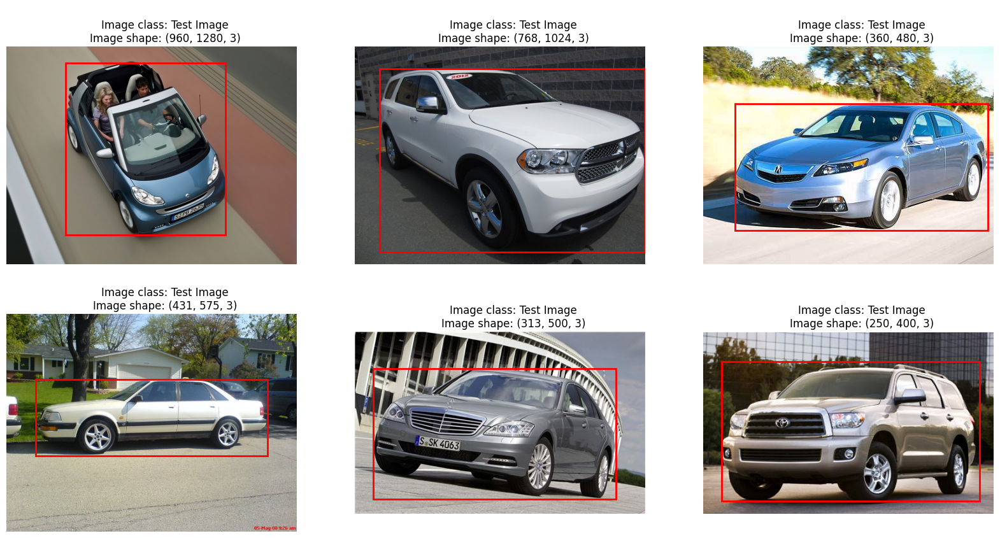

In [ ]:
show_samples(test_df)

# Project Configurations

In [ ]:
#DIR CONFIGS
DATA_PATH = Path('/content/stanford-cars-dataset')
META_PATH = Path(os.path.join(DATA_PATH,"car_devkit","devkit"))
CARS_TRAIN_PATH = Path(os.path.join(DATA_PATH,"cars_train","cars_train"))
CARS_TEST_PATH = Path(os.path.join(DATA_PATH,"cars_test","cars_test"))

## DATA CONFIGS
IMG_SIZE = 480
IMAGE_CHANNELS = 3
NUM_CLASSES = 196
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
BATCH_SIZE=16

## GENERAL CONFIGS
TRAIN_SPLIT = 0.8
SCALE = 1.2
SEED = 42
NUM_WORKERS = os.cpu_count()

# General Helper Functions

In [ ]:
def set_seeds(TORCH_SEED: int) -> None:
    """
    Sets the manual SEED
    """
    random.seed(TORCH_SEED)
    np.random.seed(TORCH_SEED)
    torch.manual_seed(TORCH_SEED)
    torch.cuda.manual_seed_all(TORCH_SEED)
    os.environ['PYTHONHASHSEED'] = str(TORCH_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

def get_device() -> str:
    """
    Returns the default device available
    """
    return "cuda" if torch.cuda.is_available() else "cpu"

def denormalize(images, means=IMAGENET_MEAN, stds=IMAGENET_STD,device=get_device()):
    """
    Returns the denormalized image.
    """
    means = torch.tensor(means).reshape(1, 3, 1, 1).to(device)
    stds = torch.tensor(stds).reshape(1, 3, 1, 1).to(device)
    return (images * stds + means)

In [ ]:
def save_model(model_save_path, model, optimizer, epoch, avg_metrics):
    """
    Save the model, optimizer, epoch, and average metrics to the specified file path.

    """
    print(f"[INFO] Saving model to: {model_save_path}")
    torch.save(
        {
            'epoch': epoch,
            'avg_metrics': avg_metrics,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
        },
        f=model_save_path
    )

def load_checkpoint(checkpoint_path, model, optimizer):
    """
    Load the model checkpoint from the specified file path.

    """
    checkpoint = torch.load(checkpoint_path, map_location=torch.device(get_device()))

    model_state_dict = checkpoint['model_state_dict']
    optimizer_state_dict = checkpoint['optimizer_state_dict']
    model.load_state_dict(model_state_dict)
    optimizer.load_state_dict(optimizer_state_dict)
    epoch = checkpoint["epoch"]
    avg_metrics = checkpoint["avg_metrics"]

    return model, optimizer, epoch, avg_metrics

# Data preprocessing

In [ ]:
class StanfordCarsDataset(Dataset):
    def __init__(self, data_df,
                 transform = None,
                 is_test: bool = False):
        self.data_df = data_df
        self.is_test = is_test
        self.transform = transform

    def __len__(self):
        return len(self.data_df)

    def __getitem__(self, idx):
        # Get image details
        img_details = self.data_df.iloc[idx]

        img_path = img_details["file_path"]
        image = Image.open(img_path)
        img = image.convert("RGB")

        if self.transform:
            img = self.transform(img).to(torch.float)
        else:
            transform = transforms.ToTensor()
            img = transform(img).to(torch.float)

        if self.is_test:
            return img
        else:
            class_label = torch.tensor(img_details["class_idx"], dtype=torch.long)
            return (img, class_label)

In [ ]:
# Parsing the input data to Dataframes
def create_train_df(labels):
    cars_train_annos = loadmat(Path(META_PATH) / 'cars_train_annos.mat')
    train_data = [[val.flat[0] for val in line] for line in cars_train_annos["annotations"][0]]
    columns = ["bbox_x1", "bbox_y1", "bbox_x2", "bbox_y2", "class_idx", "fname"]
    train_df = pd.DataFrame(train_data, columns=columns)
    train_df["class_idx"] = train_df["class_idx"] - 1
    train_df = train_df.merge(labels, left_on='class_idx', right_index=True)
    func = lambda x: os.path.join(CARS_TRAIN_PATH, x)
    train_df["file_path"] = train_df["fname"].apply(func)
    return train_df

def create_test_df():
    cars_test_annos = loadmat(Path(META_PATH) / 'cars_test_annos.mat')
    test_data = [[val.flat[0] for val in line] for line in cars_test_annos["annotations"][0]]
    columns = ["bbox_x1", "bbox_y1", "bbox_x2", "bbox_y2", "fname"]
    test_df = pd.DataFrame(test_data, columns=columns)
    func = lambda x: os.path.join(CARS_TEST_PATH, x)
    test_df["file_path"] = test_df["fname"].apply(func)
    return test_df

def create_labels():
    cars_meta = loadmat(Path(META_PATH) / 'cars_meta.mat')
    labels = [car for car in cars_meta["class_names"][0]]
    labels = pd.DataFrame(labels, columns=["class_labels"])
    labels['class_labels'] = labels['class_labels'].str.replace(' ', '_')
    return labels

def get_data():
    labels = create_labels()
    train_df = create_train_df(labels)
    test_df = create_test_df()
    train_df, val_df = train_test_split(train_df,train_size=TRAIN_SPLIT,random_state=SEED,stratify=train_df["class_idx"])
    return train_df, val_df, test_df

In [ ]:
def get_transforms(type):
    if type == 'train':
        train_transform = transforms.Compose([
            transforms.Resize((int(IMG_SIZE * SCALE),
                               int(IMG_SIZE * SCALE))),
            transforms.RandomResizedCrop(IMG_SIZE),
            transforms.RandomGrayscale(p=0.2),
            transforms.ToTensor(),
            transforms.Normalize(mean=IMAGENET_MEAN,
                                 std=IMAGENET_STD)
        ])
        return train_transform

    elif type == 'test':
        val_test_transform = transforms.Compose([
            transforms.Resize(int(IMG_SIZE * SCALE)),
            transforms.CenterCrop(IMG_SIZE),
            transforms.ToTensor(),
            transforms.Normalize(mean=IMAGENET_MEAN,
                                 std=IMAGENET_STD)
        ])
        return val_test_transform

In [ ]:
def create_dataloaders(train_df: pd.DataFrame,
                       val_df: pd.DataFrame,
                       test_df: pd.DataFrame):
    train_transform = get_transforms("train")
    val_test_transform = get_transforms("test")

    # Create the training, validation, and test datasets using the appropriate transforms
    train_dataset = StanfordCarsDataset(data_df=train_df, transform=train_transform, is_test=False)
    val_dataset = StanfordCarsDataset(data_df=val_df, transform=val_test_transform, is_test=False)
    test_dataset = StanfordCarsDataset(data_df=test_df, transform=val_test_transform, is_test=True)

    # Create the training, validation, and test dataloaders using the appropriate datasets and batch size
    train_dataloader = DataLoader(train_dataset,batch_size=BATCH_SIZE,shuffle=True,num_workers=NUM_WORKERS,pin_memory=True)
    val_dataloader = DataLoader(val_dataset,batch_size=BATCH_SIZE,shuffle=False,num_workers=NUM_WORKERS,pin_memory=True)
    test_dataloader = DataLoader(test_dataset,batch_size=BATCH_SIZE * 2,shuffle=False,num_workers=NUM_WORKERS,pin_memory=True)

    return train_dataloader, val_dataloader, test_dataloader

# Model - EfficientNet_V2_S

In [ ]:
class VehicleImageClassfier(nn.Module):
    def __init__(self,image_channels: int = IMAGE_CHANNELS,num_classes: int = NUM_CLASSES):
        super(VehicleImageClassfier,self).__init__()

        self.image_channels = image_channels
        self.num_classes = num_classes
        self.classification_model = self.get_backbone()
        self.classification_model.classifier = nn.Sequential(
            nn.Dropout(p=0.2,inplace=True),
            nn.Linear(in_features=1280, out_features=num_classes)
            )
        self.initialize_weights()
    def forward(self,x):
        y_classification = self.classification_model(x)
        return y_classification

    def get_backbone(self):
        weights = torchvision.models.EfficientNet_V2_S_Weights.DEFAULT
        pretrained_model = torchvision.models.efficientnet_v2_s(weights=weights)
        return pretrained_model

    def initialize_weights(self):
        for module in self.classification_model.classifier.modules():
            if isinstance(module, nn.Linear):
                nn.init.xavier_uniform_(module.weight)
                if module.bias is not None:
                    nn.init.constant_(module.bias, 0)

In [ ]:
set_seeds(42)
model = VehicleImageClassfier().to(get_device())

In [ ]:
summary(model,
        input_size=(BATCH_SIZE, IMAGE_CHANNELS, IMG_SIZE, IMG_SIZE),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=15,
        row_settings=["var_names"])

Layer (type (var_name))                                           Input Shape     Output Shape    Param #         Trainable
VehicleImageClassfier (VehicleImageClassfier)                     [16, 3, 480, 480] [16, 196]       --              True
├─EfficientNet (classification_model)                             [16, 3, 480, 480] [16, 196]       --              True
│    └─Sequential (features)                                      [16, 3, 480, 480] [16, 1280, 15, 15] --              True
│    │    └─Conv2dNormActivation (0)                              [16, 3, 480, 480] [16, 24, 240, 240] 696             True
│    │    └─Sequential (1)                                        [16, 24, 240, 240] [16, 24, 240, 240] 10,464          True
│    │    └─Sequential (2)                                        [16, 24, 240, 240] [16, 48, 120, 120] 303,552         True
│    │    └─Sequential (3)                                        [16, 48, 120, 120] [16, 64, 60, 60] 589,184         True
│    │    └─S

Train Functions

In [ ]:
def evaluate_batch(y_true, y_pred):
    y_true = y_true.cpu().numpy()
    y_pred = y_pred.cpu().numpy()

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    return accuracy, precision, recall

def evaluate(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              criterion: torch.nn.Module):
    model.eval()
    device = get_device()
    test_loss, test_acc, test_precision, test_recall = 0, 0, 0, 0
    with torch.inference_mode():
        for batch, (X, y) in enumerate(dataloader):
            X, y = X.to(device), y.to(device)

            test_pred_logits = model(X)

            loss = criterion(test_pred_logits, y)
            test_loss += loss.item()

            #Calculate and accumulate accuracy
            test_pred_labels = torch.argmax(torch.softmax(test_pred_logits, dim=1), dim=1)
            batch_acc,batch_precision,batch_recall = evaluate_batch(y,test_pred_labels)

            test_acc += batch_acc
            test_precision += batch_precision
            test_recall += batch_recall

    # Calculate average metrics per batch
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    test_precision = test_precision / len(dataloader)
    test_recall = test_recall / len(dataloader)

    return test_loss, test_acc, test_precision, test_recall

In [ ]:
def train_model(model,train_dataloader,test_dataloader,config):
    torch.cuda.empty_cache()
    device = get_device()
    criterion = nn.CrossEntropyLoss().to(device)
    optimizer = optim.AdamW(model.parameters(),lr=config.learning_rate,weight_decay=config.weight_decay)
#     optimizer = optim.SGD(model.parameters(),lr=config.learning_rate,momentum=config.momentum,weight_decay=config.weight_decay)
#     scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=config.step_size, gamma=config.gamma)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=config.tmax, eta_min=config.eta_min, last_epoch=-1)
#     scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer,factor=config.factor,patience=config.patience, mode='max')
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    wandb.init(project=config.project,name=config.experiment_name,config=config)

    for epoch in tqdm(range(config.start_iter,config.epochs)):

        model.train()
        train_loss, train_acc, train_precision, train_recall = 0, 0, 0, 0
#         scheduler.step()
        for  (X, y) in (train_dataloader):
            X, y = X.to(device), y.to(device)
            y_pred = model(X)

            loss = criterion(y_pred, y)
            train_loss += loss.item()

            optimizer.zero_grad()
            loss.backward()

            if config.grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), config.grad_clip)
            optimizer.step()

            with torch.no_grad():
                y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
                batch_acc,batch_precision,batch_recall = evaluate_batch(y,y_pred_class)

                train_acc += batch_acc
                train_precision += batch_precision
                train_recall += batch_recall

        # calculate avg metrics per batch
        avg_metrics = OrderedDict()
        avg_metrics['lr'] = optimizer.param_groups[0]['lr']
        avg_metrics['train_loss'] = train_loss / len(train_dataloader)
        avg_metrics['train_acc'] = train_acc / len(train_dataloader)
        avg_metrics['train_precision'] = train_precision/ len(train_dataloader)
        avg_metrics['train_recall'] = train_recall/ len(train_dataloader)
        avg_metrics['train_f1'] = (2 * (train_precision * train_recall) / (train_precision + train_recall)) / len(train_dataloader)

        test_loss, test_acc, test_precision, test_recall = evaluate(model,test_dataloader,criterion)
        avg_metrics['val_loss'] = test_loss
        avg_metrics['val_acc'] = test_acc
        avg_metrics['val_precision'] = test_precision
        avg_metrics['val_recall'] = test_recall
        avg_metrics['val_f1'] = 2 * (test_precision * test_recall) / (test_precision + test_recall)

#         scheduler.step(avg_metrics['val_f1'])
        scheduler.step()

        wandb.log(avg_metrics, step=epoch+1)
        print(f"Epoch : {epoch+1}")
        print(f"Train Loss : {avg_metrics['train_loss']: .4f} | Train Acc : {avg_metrics['train_acc']: .4f} | Train F1 : {avg_metrics['train_f1']: .4f} ")
        print(f"Val Loss   : {avg_metrics['val_loss']: .4f}   | Val Acc : {avg_metrics['val_acc']: .4f}     | Val F1   : {avg_metrics['val_f1']: .4f}")

        if (epoch+1) % config.checkpoint_period == 0:
            os.makedirs(config.models_dir, exist_ok=True)
            model_save_path  = os.path.join(config.models_dir, f'model_chkpt_{epoch+1}_acc_{avg_metrics["val_acc"]: .3f}.pth')
            # save_model(model_save_path, model,optimizer,epoch+1,avg_metrics)
        if avg_metrics['val_acc']  > best_acc and avg_metrics['val_acc'] > config.metric_threshold:
            best_acc = avg_metrics['val_acc']
            best_model_wts = copy.deepcopy(model.state_dict())
            os.makedirs(config.models_dir, exist_ok=True)
            model_save_path  = os.path.join(config.models_dir, f'{config.experiment_name}_best_model.pth')
            save_model(model_save_path, model,optimizer,epoch+1,avg_metrics)

    wandb.finish()
    print()
    print(f"Best Val Acc: {best_acc:.4f}")
    model.load_state_dict(best_model_wts)

    return model

# Model Traning and checkpoint loading

The traning is performed with different hyperparameter settings on different architectures such as Vit,Efficientnet_V2 and ResNet.

The Efficientnet_V2 Small architecture with the below Hyperparameters has given a best model with Validation Accuray of 0.9214 and Validation F1 score of 0.8590

In [ ]:
config = dict()
config.update({
    "project":"kaggle_vit",
    "experiment_name":"Efficientnet_V2_S_AdamW_CosineAnLR_tmax_50_bs_16",
    "models_dir": os.path.join(os.getcwd(),"models"),
    "start_iter": 0,
    "epochs": 50,
    "checkpoint_period": 3,
    "grad_clip": 1.2,
    "metric": "val_f1",
    "optimizer": "AdamW",
    "learning_rate": 0.0001,
    'weight_decay': 0.000025,
    "momentum":0.9,
    'scheduler': 'CosineAnnealingLR',
    'tmax': 50,
    'eta_min': 0.00001,
    "metric_threshold":0.90

})
config = Munch(config)
config

Munch({'project': 'kaggle_vit', 'experiment_name': 'Efficientnet_V2_S_AdamW_CosineAnLR_tmax_50_bs_16', 'models_dir': '/content/models', 'start_iter': 0, 'epochs': 50, 'checkpoint_period': 3, 'grad_clip': 1.2, 'metric': 'val_f1', 'optimizer': 'AdamW', 'learning_rate': 0.0001, 'weight_decay': 2.5e-05, 'momentum': 0.9, 'scheduler': 'CosineAnnealingLR', 'tmax': 50, 'eta_min': 1e-05, 'metric_threshold': 0.9})

In [ ]:
model= VehicleImageClassfier().to(get_device())
optimizer = optim.AdamW(model.parameters())

In [ ]:
train_df, val_df, test_df = get_data()
train_dataloader, val_dataloader, test_dataloader = create_dataloaders(train_df, val_df, test_df)

In [ ]:
### Load Check point
model_path = "/content/drive/MyDrive/trainedmodels/Efficientnet_V2_S_AdamW_CosineAnLR_tmax_50_bs_16_best_model.pth"
model,optimizer,epoch,best_metrics = load_checkpoint(model_path,model,optimizer)

In [ ]:
best_metrics

OrderedDict([('lr', 1.5566199398026146e-05),
             ('train_loss', 0.24408548272856256),
             ('train_acc', 0.9422487745098039),
             ('train_precision', 0.8991025764020759),
             ('train_recall', 0.8970839006397174),
             ('train_f1', 0.8980921041587673),
             ('val_loss', 0.3486251016033302),
             ('val_acc', 0.9214272247360482),
             ('val_precision', 0.859458391629786),
             ('val_recall', 0.8586029514144841),
             ('val_f1', 0.8590304585559436)])

# Performance on different classes

In [ ]:
labels = create_labels()
class_labels_dict = labels['class_labels'].to_dict()

In [ ]:
def evaluate_classes(model, val_loader, class_labels):
    model.eval()
    device = get_device()
    total_samples = 0
    correct_predictions = 0

    class_correct = torch.zeros(len(class_labels))
    class_total = torch.zeros(len(class_labels))

    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            total_samples += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()

            for i in range(len(labels)):
                label = labels[i]
                prediction = predicted[i]
                class_correct[label] += (prediction == label).item()
                class_total[label] += 1

    data = []
    for i in range(len(class_labels)):
        class_name = class_labels[i]
        total = int(class_total[i])
        correct = int(class_correct[i])
        incorrect = total - correct
        accuracy = 100 * correct / total
        data.append([class_name, total, correct, incorrect, accuracy])

    columns = ['Class Name', 'Total Samples', 'Correctly Predicted', 'Incorrectly Predicted', 'Accuracy']
    df = pd.DataFrame(data, columns=columns)

    return df

In [ ]:
results = evaluate_classes(model,val_dataloader,class_labels_dict)
results.head()

,Class Name,Total Samples,Correctly Predicted,Incorrectly Predicted,Accuracy
0,AM_General_Hummer_SUV_2000,9,9,0,100.000000
1,Acura_RL_Sedan_2012,6,5,1,83.333333
2,Acura_TL_Sedan_2012,9,9,0,100.000000
3,Acura_TL_Type-S_2008,8,8,0,100.000000
4,Acura_TSX_Sedan_2012,8,7,1,87.500000


In [ ]:
accuracy_filt = results["Accuracy"] < 75
least_acc = results[accuracy_filt].sort_values(by="Accuracy")
least_acc

,Class Name,Total Samples,Correctly Predicted,Incorrectly Predicted,Accuracy
70,Chevrolet_Express_Van_2007,7,3,4,42.857143
61,Chevrolet_Tahoe_Hybrid_SUV_2012,7,3,4,42.857143
124,HUMMER_H2_SUT_Crew_Cab_2009,9,5,4,55.555556
13,Audi_TTS_Coupe_2012,9,5,4,55.555556
68,Chevrolet_Silverado_2500HD_Regular_Cab_2012,7,4,3,57.142857
16,Audi_100_Sedan_1994,8,5,3,62.500000
83,Dodge_Caliber_Wagon_2007,8,5,3,62.500000
18,Audi_TT_Hatchback_2011,8,5,3,62.500000
82,Dodge_Caliber_Wagon_2012,8,5,3,62.500000
87,Dodge_Sprinter_Cargo_Van_2009,8,5,3,62.500000


In [ ]:
def show_val_samples(model, idx, class_labels_dict,predict=False):
    """
    Display a sample of validation images and their corresponding true and predicted labels using a trained model.
    """
    model.eval()
    device = get_device()

    # Filter the validation dataset to get samples of the specified class index
    samples_df = val_df[val_df["class_idx"] == idx]
    samples_df = val_df[val_df["class_idx"] == idx]

    # Get the sample transform and create a dataset and dataloader for the samples
    sample_transform = get_transforms("test")
    sample_dataset = StanfordCarsDataset(data_df=samples_df, transform=sample_transform, is_test=False)
    sample_dataloader = DataLoader(sample_dataset, batch_size=6, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

    with torch.no_grad():
        for images, labels in sample_dataloader:
            images = images.to(device)
            labels = labels.to(device)
            if predict:
                outputs = model(images)
                _, predicted = torch.max(outputs, 1)

            rows = math.ceil(images.shape[0] / 3)
            fig, axes = plt.subplots(rows, 3, figsize=(15, 8))
            axes = axes if rows == 1 else [ax for sub_ax in axes for ax in sub_ax]
            for ax, id in zip(axes, range(images.shape[0])):
                img = denormalize(images[id]).squeeze(axis=0).permute(1, 2, 0).cpu()
                ax.imshow(img)
                true_class_name = class_labels_dict[labels[id].item()]
                title = f"Image size: {tuple(images[id].squeeze(axis=0).shape)}\n"
                title += f"True label({labels[id].item()}): {true_class_name}"

                if predict:
                    pred_label = class_labels_dict[predicted[id].item()]
                    title += f"\nPredicted label({predicted[id].item()}): {pred_label}"

                ax.set_title(title, fontsize="small")
                ax.set_axis_off()

            for idx,ax in enumerate(axes):
                if (idx + 1) > images.shape[0]:
                    ax.set_visible(False)

            plt.show()

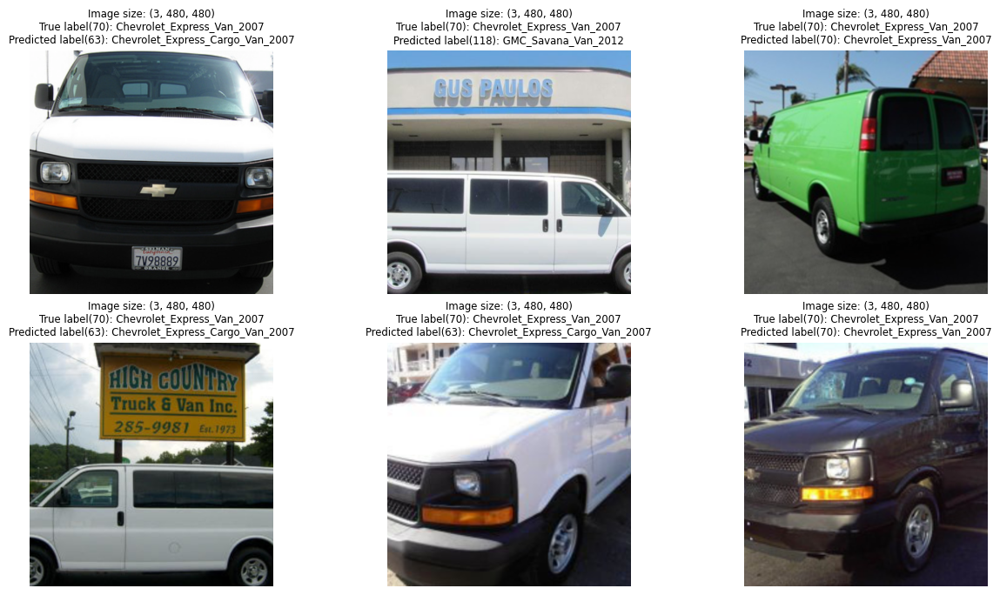

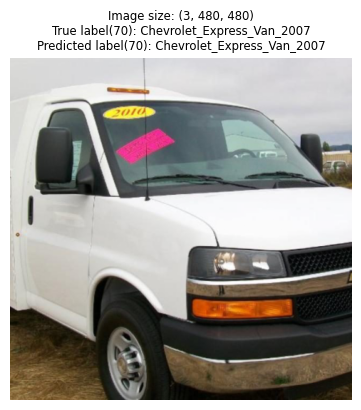

In [ ]:
show_val_samples(model, 70, class_labels_dict,True)

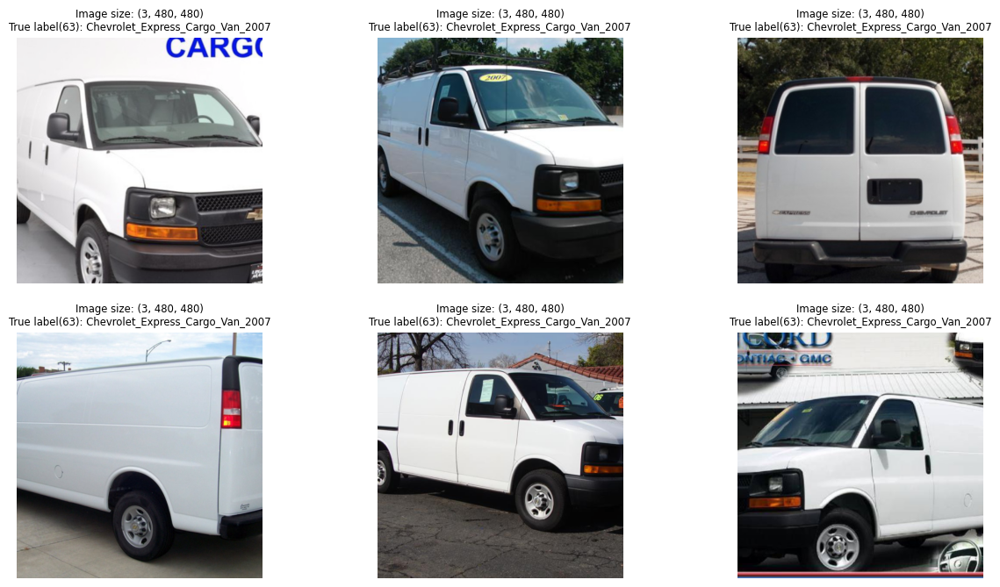

In [ ]:
show_val_samples(model, 63, class_labels_dict,False)

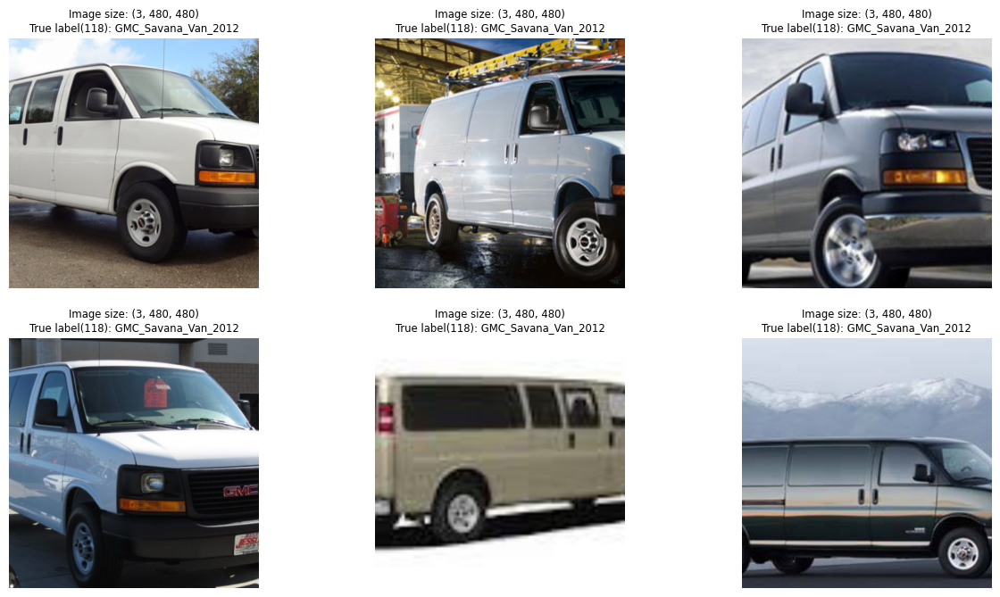

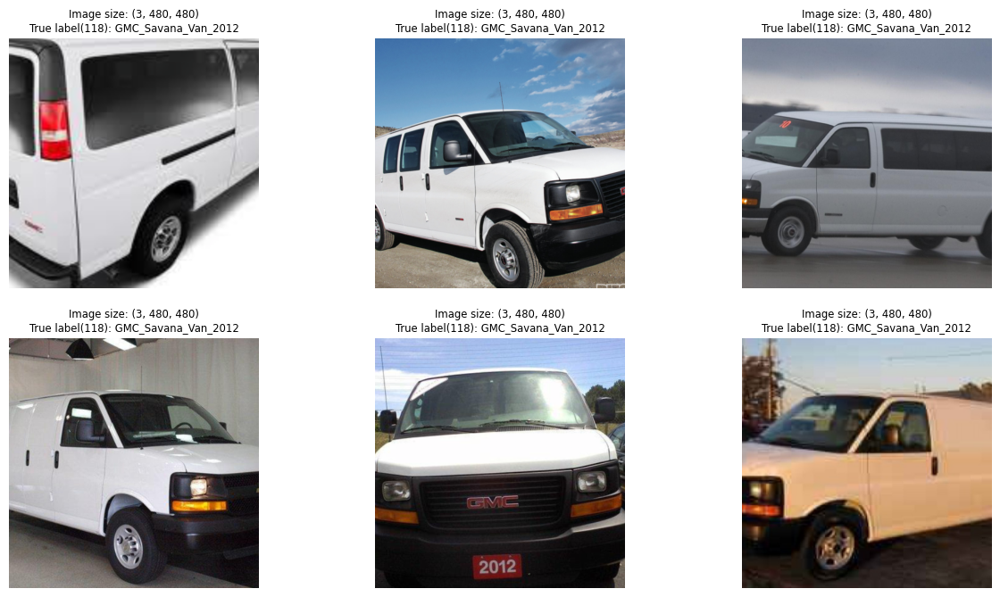

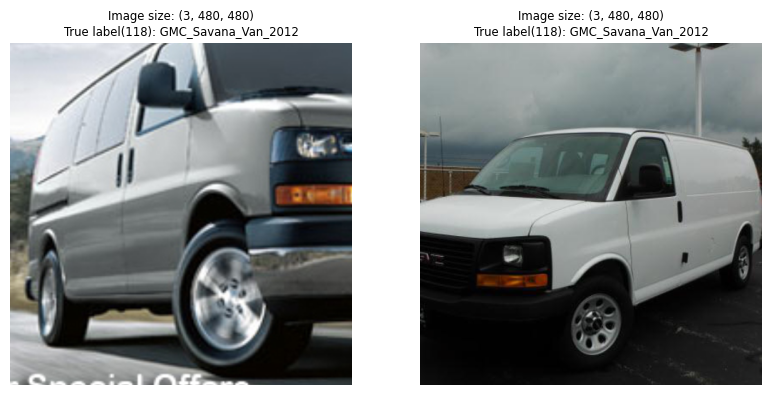

In [ ]:
show_val_samples(model, 118, class_labels_dict,False)

# Testing the model on test set


In [ ]:
def show_test_samples(model, class_labels_dict,test_dataloader):
    """
    Display a sample of validation images and their corresponding true and predicted labels using a trained model.
    """
    model.eval()
    device = get_device()

    with torch.no_grad():
        for images in test_dataloader:
            images = images.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            fig, axes = plt.subplots(11, 3, figsize=(15, 55))
            axes = [ax for sub_ax in axes for ax in sub_ax]
            for ax, id in zip(axes, range(images.shape[0])):
                img = denormalize(images[id]).squeeze(axis=0).permute(1, 2, 0).cpu()
                ax.imshow(img)
                title = f"Image size: {tuple(images[id].squeeze(axis=0).shape)}\n"
                pred_label = class_labels_dict[predicted[id].item()]
                title += f"Predicted label({predicted[id].item()}): {pred_label}"

                ax.set_title(title, fontsize="small")
                ax.set_axis_off()

            for idx,ax in enumerate(axes):
                if (idx + 1) > images.shape[0]:
                    ax.set_visible(False)

            plt.show()
            break

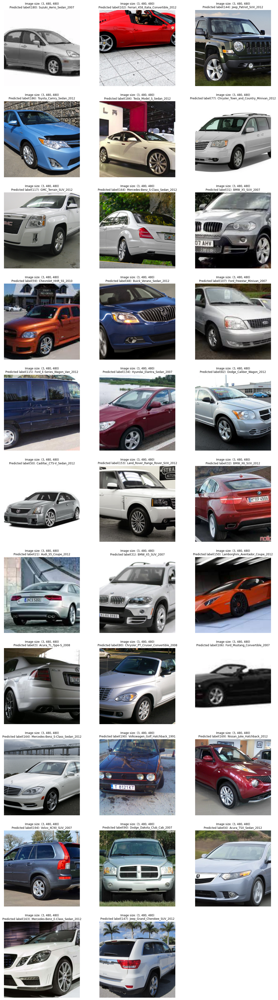

In [ ]:
show_test_samples(model, class_labels_dict,test_dataloader)